# Deep Learning Assignment - 2

## Transfer Learning
---

- Name : Savanth Nair
- Student ID: 24891626
- Assignment Task : AT2 Computer Vision

Here we are importing the SSL module and disable default certificate verfication

In [1]:
# Solution
import ssl
ssl._create_default_https_context = ssl._create_unverified_context

Import required packages

In [2]:
# Solution
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models
from torchvision import datasets, transforms
from sklearn.model_selection import train_test_split
from torch.utils.data import Subset, DataLoader
from google.colab import drive

Downloading and Extracting the Dataset

In [3]:
!pip install wget

import tarfile
import wget
def download_and_extract_dataset(url, destination_path):
    if not os.path.exists(destination_path):
        os.makedirs(destination_path)
    tar_path = os.path.join(destination_path, 'food-101.tar.gz')
    if not os.path.exists(tar_path):
        print("Downloading the dataset... This may take a while!")
        wget.download(url, tar_path)
        print("\nDownload completed!")
    else:
        print("Dataset already downloaded.")

    print("Extracting the dataset...")
    with tarfile.open(tar_path, "r:gz") as tar:
        tar.extractall(path=destination_path)
    print("Extraction completed!")

# URL and destination
url = 'http://data.vision.ee.ethz.ch/cvl/food-101.tar.gz'
destination_path = './data'

download_and_extract_dataset(url, destination_path)

  Preparing metadata (setup.py) ... done
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9656 sha256=77d08b8cade1915cbee61ac17c65c36b6295481f40f088286e6d85e8e636cdc6
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget

Download completed!
Extracting the dataset...
Extraction completed!


Applying transformation using compose class to the image. This time  will not only normalize the images but will also perform some data transformation such as Resize (image_size, image_size).

In [4]:
# Solution
image_size = 299
transform = transforms.Compose([
    transforms.Resize((image_size, image_size)),  # Resize images while maintaining aspect ratio
    transforms.ToTensor(),  # Convert images to tensors
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize images
])


Let's load the dataset using torchvision.datasets.ImageFolder

In [5]:
import os

def load_food101_data(data_dir, meta_dir):
    classes = sorted([d for d in os.listdir(data_dir) if os.path.isdir(os.path.join(data_dir, d)) and not d.startswith('.')])
    class_to_idx = {cls_name: idx for idx, cls_name in enumerate(classes)}

    full_data = []

    with open(os.path.join(meta_dir, 'train.txt'), 'r') as file:
        for line in file:
            image_name = line.strip()
            label_name = image_name.split('/')[0]
            image_path = os.path.join(data_dir, image_name + '.jpg')
            label = class_to_idx.get(label_name)
            if label is not None:
                full_data.append((image_path, label))

    with open(os.path.join(meta_dir, 'test.txt'), 'r') as file:
        for line in file:
            image_name = line.strip()
            label_name = image_name.split('/')[0]
            image_path = os.path.join(data_dir, image_name + '.jpg')
            label = class_to_idx.get(label_name)
            if label is not None:
                full_data.append((image_path, label))

    return full_data

data_dir = '/content/data/food-101/images'
meta_dir = '/content/data/food-101/meta'
full_data = load_food101_data(data_dir, meta_dir)




### 2.   Preparing the Dataset


Lets split the size of the full_dataset into train, test and validation data set according to following ratio 70%:15%:15% and save it into train_ratio, val_ratio and test_ratio.

In [6]:
# Solution
train_ratio = 0.7
val_ratio = 0.15
test_ratio = 0.15


According to the size of the dataset, now we will split a dataset into several subsets such as train_set,val_set, and test_set.

In [7]:
# Solution
# Split indices into training and combined validation/test indices
train_indices, test_val_indices = train_test_split(range(len(full_data)), test_size=(val_ratio + test_ratio), random_state=42)

# Split combined validation/test indices into separate validation and test indices
val_indices, test_indices = train_test_split(test_val_indices, test_size=test_ratio/(val_ratio + test_ratio), random_state=42)

train_set = Subset(full_data, train_indices)  # Subset for training data
val_set = Subset(full_data, val_indices)      # Subset for validation data
test_set = Subset(full_data, test_indices)    # Subset for test data

 Now we will call the DataLoader function that iteratively loads data based on batch size, shuffle and save it into three different variables called `train_loader`, `val_loader` and `test_loader`. Set the `BATCH_SIZE` to 20. The shuffle is a boolean variable. By default the shuffle value is false. If the shuffle is `True` means that the data is randomly shuffled before each epoch, so the order of the data is different in each epoch.

In [8]:
# Solution
batch_size = 128
train_loader = DataLoader(train_set, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_set, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_set, batch_size=batch_size, shuffle=False)


Let's have a look at the length of `train_set`, `val_set`, and `test_set`.

In [9]:
# Print sizes of datasets
print("Training set size:", len(train_set))
print("Validation set size:", len(val_set))
print("Test set size:", len(test_set))

Training set size: 70700
Validation set size: 15150
Test set size: 15150


Creating a 10% sample of train validation and test set and used the data loader function

In [10]:
import random

# Assuming subset_data is your Subset object

# Calculate the number of samples to select (10% of the total samples)
sample_size_train = int(0.1 * len(train_loader.dataset))
sample_size_val = int(0.1 * len(val_loader.dataset))
sample_size_test = int(0.1 * len(test_loader.dataset))

# Create a list of indices from the Subset object
indices_train = list(range(len(train_loader.dataset)))
indices_val = list(range(len(val_loader.dataset)))
indices_test = list(range(len(test_loader.dataset)))

# Randomly sample 10% of the indices
sampled_indices_train = random.sample(indices_train, k=sample_size_train)
sampled_indices_val = random.sample(indices_val, k=sample_size_val)
sampled_indices_test = random.sample(indices_test, k=sample_size_test)

# Create a new Subset object with the sampled indices
sampled_subset_train = torch.utils.data.Subset(train_loader.dataset, sampled_indices_train)
sampled_subset_val = torch.utils.data.Subset(val_loader.dataset, sampled_indices_val)
sampled_subset_test = torch.utils.data.Subset(test_loader.dataset, sampled_indices_test)

print(len(sampled_subset_train))
print(len(sampled_subset_val))
print(len(sampled_subset_test))

7070
1515
1515


In [11]:
batch_size = 128
sample_train_loader = DataLoader(sampled_subset_train, batch_size=batch_size, shuffle=True)
sample_val_loader = DataLoader(sampled_subset_val, batch_size=batch_size, shuffle=False)
sample_test_loader = DataLoader(sampled_subset_test, batch_size=batch_size, shuffle=False)

Let's print the class labels of the dataset.

In [12]:
import os

def load_food101_data(data_dir, meta_dir):
    classes = sorted([d for d in os.listdir(data_dir) if os.path.isdir(os.path.join(data_dir, d)) and not d.startswith('.')])
    class_to_idx = {cls_name: idx for idx, cls_name in enumerate(classes)}

    full_data = []

    with open(os.path.join(meta_dir, 'train.txt'), 'r') as file:
        for line in file:
            image_name = line.strip()
            label_name = image_name.split('/')[0]
            image_path = os.path.join(data_dir, image_name + '.jpg')
            label = class_to_idx.get(label_name)
            if label is not None:
                full_data.append((image_path, label))

    with open(os.path.join(meta_dir, 'test.txt'), 'r') as file:
        for line in file:
            image_name = line.strip()
            label_name = image_name.split('/')[0]
            image_path = os.path.join(data_dir, image_name + '.jpg')
            label = class_to_idx.get(label_name)
            if label is not None:
                full_data.append((image_path, label))

    return classes

data_dir = '/content/data/food-101/images'
meta_dir = '/content/data/food-101/meta'
class_labels = load_food101_data(data_dir, meta_dir)

# Print the class labels
print("Class labels:", class_labels)
print(f"Total number of classes: {len(class_labels)}")


Class labels: ['apple_pie', 'baby_back_ribs', 'baklava', 'beef_carpaccio', 'beef_tartare', 'beet_salad', 'beignets', 'bibimbap', 'bread_pudding', 'breakfast_burrito', 'bruschetta', 'caesar_salad', 'cannoli', 'caprese_salad', 'carrot_cake', 'ceviche', 'cheese_plate', 'cheesecake', 'chicken_curry', 'chicken_quesadilla', 'chicken_wings', 'chocolate_cake', 'chocolate_mousse', 'churros', 'clam_chowder', 'club_sandwich', 'crab_cakes', 'creme_brulee', 'croque_madame', 'cup_cakes', 'deviled_eggs', 'donuts', 'dumplings', 'edamame', 'eggs_benedict', 'escargots', 'falafel', 'filet_mignon', 'fish_and_chips', 'foie_gras', 'french_fries', 'french_onion_soup', 'french_toast', 'fried_calamari', 'fried_rice', 'frozen_yogurt', 'garlic_bread', 'gnocchi', 'greek_salad', 'grilled_cheese_sandwich', 'grilled_salmon', 'guacamole', 'gyoza', 'hamburger', 'hot_and_sour_soup', 'hot_dog', 'huevos_rancheros', 'hummus', 'ice_cream', 'lasagna', 'lobster_bisque', 'lobster_roll_sandwich', 'macaroni_and_cheese', 'macaro

Now we will display the images with the labels.

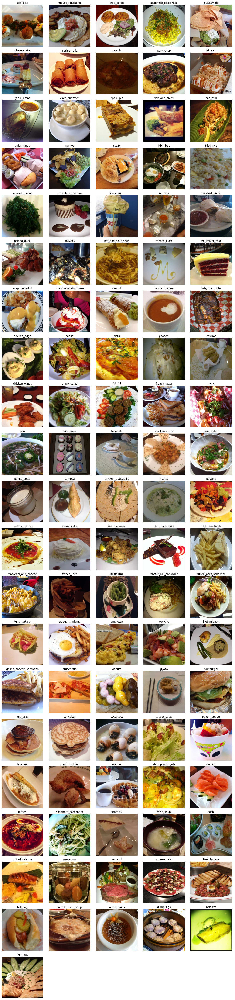

In [13]:
# Solution
import matplotlib.pyplot as plt  # Import matplotlib for plotting
import numpy as np  # Import NumPy for numerical operations
from PIL import Image

# Define a function to display images with labels
def show_images(images, labels, class_labels):
    # Calculate the number of images and rows required
    num_images = len(images)
    num_rows = (num_images + 4) // 5  # 5 images per row, rounded up
    # Create a figure and axes for subplots
    fig, axes = plt.subplots(num_rows, 5, figsize=(15, 3 * num_rows))
    axes = axes.flatten()  # Flatten the axes array for easier indexing

    # Loop through the images and corresponding labels
    for i, (image, label) in enumerate(zip(images, labels)):

        image = Image.open(image)
        # Apply transformations
        image = transform(image).numpy().transpose((1, 2, 0))
        mean = np.array([0.485, 0.456, 0.406])  # Mean values used for normalization
        std = np.array([0.229, 0.224, 0.225])  # Standard deviation values used for normalization
        image = std * image + mean  # Denormalize the image
        image = np.clip(image, 0, 1)  # Clip pixel values to range [0, 1]

        # Display the image and set its title as the class label
        axes[i].imshow(image)  # Display the image
        axes[i].set_title(class_labels[label])  # Set the title of the subplot as the class label
        axes[i].axis('off')  # Hide axis

    # Hide empty subplots
    for j in range(num_images, num_rows * 5):
        axes[j].axis('off')  # Hide axis for empty subplots

    # Adjust layout and display the plot
    plt.tight_layout()  # Adjust the layout of subplots
    plt.show()  # Display the plot

# Get one image from each class
images, labels = [], []  # Initialize lists to store images and labels
classes_found = set()  # Keep track of classes already found
for img, lbl in train_loader:  # Iterate through the training loader
    for image, label in zip(img, lbl):  # Iterate through each image and label in the batch
        # Check if we have already found an image from this class
        if class_labels[label.item()] not in classes_found:
            images.append(image)  # Add the image to the list of images
            labels.append(label)  # Add the label to the list of labels
            classes_found.add(class_labels[label.item()])  # Add the class to the set of found classes
    # If we have found one image from each class, stop looping
    if len(images) == len(class_labels):
        break

# Display one image from each class with 5 images per row
show_images(images, labels, class_labels)  # Call the show_images function to display the images

#Model 1 - MobileNet V3

In [ ]:
import torch
from torchvision import models
import torch.nn as nn

# Load the pre-trained MobileNet V3 model
model1 = models.mobilenet_v3_large(pretrained=True)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V3_Large_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V3_Large_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/mobilenet_v3_large-8738ca79.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v3_large-8738ca79.pth
100%|██████████| 21.1M/21.1M [00:00<00:00, 72.5MB/s]


In [25]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [ ]:
for param in model1.parameters():
    param.requires_grad = False


In [ ]:
# Replace the classifier
model1.classifier = nn.Sequential(
    nn.Linear(960, 1024),
    nn.ReLU(),
    nn.Linear(1024, 512),
    nn.ReLU(),
    nn.Linear(512, 101)  # Output layer for 101 classes
)

In [ ]:
# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model1.classifier.parameters(), lr=0.001)


model1.to(device)

MobileNetV3(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
      (2): Hardswish()
    )
    (1): InvertedResidual(
      (block): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=16, bias=False)
          (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
        )
        (1): Conv2dNormActivation(
          (0): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
        )
      )
    )
    (2): InvertedResidual(
      (block): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1), bi

In [ ]:
from PIL import Image
import torch
import torchvision
from torchvision import transforms

def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=5):
    model.to(device)

    # Define transformation for input normalization
    input_transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    total_val_accuracy = 0
    total_train_accuracy = 0

    for epoch in range(num_epochs):
        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 10)

        # Separate training and validation phases
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
                data_loader = train_loader
            else:
                model.eval()
                data_loader = val_loader

            running_loss = 0.0
            running_corrects = 0
            total_samples = 0

            for inputs, labels in data_loader:
                # Apply transformation and move to the correct device
                inputs = [input_transform(Image.open(i).convert('RGB')) for i in inputs]
                inputs = torch.stack(inputs).to(device)
                labels = labels.to(device)

                # Zero the parameter gradients
                optimizer.zero_grad()

                # Forward pass
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # Statistics
                if phase == 'val':
                    running_loss += loss.item() * inputs.size(0)
                    running_corrects += torch.sum(preds == labels.data)
                    total_samples += inputs.size(0)
                else:
                    running_corrects += torch.sum(preds == labels.data)
                    total_samples += inputs.size(0)

            if phase == 'train':
                epoch_acc = running_corrects.double() / total_samples
                print(f'Training Acc: {epoch_acc:.4f}')
                total_train_accuracy += epoch_acc
            else:
                epoch_loss = running_loss / total_samples
                epoch_acc = running_corrects.double() / total_samples
                print(f'Validation Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')
                total_val_accuracy += epoch_acc

    # Calculate and print the average accuracy over all epochs for training and validation
    average_train_accuracy = total_train_accuracy / num_epochs
    average_val_accuracy = total_val_accuracy / num_epochs
    print(f'\nAverage Training Accuracy over {num_epochs} epochs: {average_train_accuracy:.4f}')
    print(f'Average Validation Accuracy over {num_epochs} epochs: {average_val_accuracy:.4f}')

In [ ]:
# Example usage of the training loop
train_model(model1,sample_train_loader, sample_val_loader, criterion, optimizer, num_epochs=5)

Epoch 1/5
----------
Training Acc: 0.4465
Validation Loss: 2.1598 Acc: 0.4607
Epoch 2/5
----------
Training Acc: 0.5337
Validation Loss: 2.1015 Acc: 0.4706
Epoch 3/5
----------
Training Acc: 0.6016
Validation Loss: 2.1690 Acc: 0.4548
Epoch 4/5
----------
Training Acc: 0.6760
Validation Loss: 2.2408 Acc: 0.4475
Epoch 5/5
----------
Training Acc: 0.7413
Validation Loss: 2.3311 Acc: 0.4614

Average Training Accuracy over 5 epochs: 0.5998
Average Validation Accuracy over 5 epochs: 0.4590


#Model 2 - NasNet

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import NASNetMobile
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# Load the pre-trained NASNet model
base_model = NASNetMobile(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers of the base model
for layer in base_model.layers:
    layer.trainable = False

# Add new layers on top
x = base_model.output  # Get the output of the base model
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(101, activation='softmax')(x)

# Define the new model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model.compile(optimizer=Adam(lr=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Function to convert PyTorch tensors to TensorFlow tensors
def convert_data(loader):
    while True:
        for inputs, labels in loader:
            if isinstance(inputs, torch.Tensor):  # Check if inputs is a tuple
                inputs = [inputs.numpy() for inputs in inputs]  # Convert tensor elements to NumPy arrays
            else:
                # Resize all images to a fixed size
                resized_inputs = [Image.open(i).convert('RGB').resize((224, 224)) for i in inputs]

                # Convert resized images to NumPy arrays
                inputs = [np.array(image) for image in resized_inputs]

                # Convert NumPy arrays to PyTorch tensors
                inputs = torch.stack([torch.from_numpy(image) for image in inputs]).to(device)

            labels = tf.keras.utils.to_categorical(labels.numpy(), num_classes=101)  # Convert labels to one-hot encoding
            yield inputs, labels

# Prepare generators for training and validation
train_generator = convert_data(sample_train_loader)
val_generator = convert_data(sample_val_loader)

# Assuming your train_loader and val_loader provide 100 and 50 batches respectively
train_steps_per_epoch = 100  # This should ideally be the total number of batches in the train_loader
val_steps_per_epoch = 50     # This should ideally be the total number of batches in the val_loader

# Train the model
history = model.fit(train_generator, steps_per_epoch=train_steps_per_epoch, epochs=5,
                    validation_data=val_generator, validation_steps=val_steps_per_epoch)

# Calculate and print training accuracy
train_accuracy = model.evaluate(train_generator, steps=train_steps_per_epoch)
print('Training accuracy:', train_accuracy[1])

# Calculate and print validation accuracy
accuracy = model.evaluate(val_generator, steps=val_steps_per_epoch)
print('Validation accuracy:', accuracy[1])




19993432/19993432 [==============================] - 0s 0us/step


Epoch 1/5
100/100 [==============================] - 918s 9s/step - loss: 5.5190 - accuracy: 0.0116 - val_loss: 4.6155 - val_accuracy: 0.0108
Epoch 2/5
100/100 [==============================] - 875s 9s/step - loss: 4.6448 - accuracy: 0.0096 - val_loss: 4.6151 - val_accuracy: 0.0104
Epoch 3/5
100/100 [==============================] - 876s 9s/step - loss: 4.6288 - accuracy: 0.0123 - val_loss: 4.6151 - val_accuracy: 0.0098
Epoch 4/5
100/100 [==============================] - 832s 8s/step - loss: 4.6220 - accuracy: 0.0110 - val_loss: 4.6154 - val_accuracy: 0.0095
Epoch 5/5
100/100 [==============================] - 560s 6s/step - loss: 4.6103 - accuracy: 0.0148
Training accuracy: 0.014765944331884384
50/50 [==============================] - 279s 6s/step - loss: 4.6151 - accuracy: 0.0108
Validation accuracy: 0.010766307823359966


#Model 3 - GoogleNet

In [14]:
googlenet_model = models.inception_v3(pretrained=True)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth
100%|██████████| 104M/104M [00:01<00:00, 104MB/s]


In [15]:
# Solution
# Freeze all layers
for param in googlenet_model.parameters():
    param.requires_grad = False

In [16]:
# Solution
num_ftrs = googlenet_model.fc.in_features
googlenet_model.fc = nn.Sequential(
    nn.Flatten(),                   # Flatten the output
    nn.Linear(num_ftrs, 500),       # First fully connected layer
    nn.ReLU(),                      # ReLU activation
    nn.Linear(500, 300),            # Second fully connected layer
    nn.ReLU(),                      # ReLU activation
    nn.Linear(300, 101),            # Output layer with 101 units for 101 output classes
    nn.Softmax(dim=1)               # Softmax activation for classification
)
tuned_model = googlenet_model

In [17]:
print(tuned_model)

Inception3(
  (Conv2d_1a_3x3): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2a_3x3): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2b_3x3): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Conv2d_3b_1x1): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_4a_3x3): BasicConv2d(
    (conv): Conv2d(80, 192, kernel_size=(3, 3), stri

In [18]:
# Solution
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(tuned_model.parameters(), lr=0.00001)

In [26]:
tuned_model.to(device)

Inception3(
  (Conv2d_1a_3x3): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2a_3x3): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2b_3x3): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Conv2d_3b_1x1): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_4a_3x3): BasicConv2d(
    (conv): Conv2d(80, 192, kernel_size=(3, 3), stri

In [28]:
from PIL import Image

# Initialize lists to store epoch-wise values
train_losses = []  # List to store training losses
train_accuracies = []  # List to store training accuracies
val_losses = []  # List to store validation losses
val_accuracies = []  # List to store validation accuracies

transform = transforms.Compose([
    transforms.Resize((299, 299)),  # Resize images to 224x224
    transforms.ToTensor(),           # Convert images to tensors
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize images
])

# Training loop

num_epochs = 5  # Number of epochs for training
for epoch in range(num_epochs):
    # Training
    tuned_model.train()  # Set the model to training mode
    running_train_loss = 0.0  # Initialize running training loss
    correct_train = 0  # Initialize number of correctly predicted training samples
    total_train = 0  # Initialize total number of training samples
    for inputs, labels in sample_train_loader:
        batch_images = []  # List to store preprocessed image tensors for this batch
        for path in inputs:
          # Load image from path
          image = Image.open(path).convert('RGB')
          # Apply transformations
          image = transform(image)
          # Add preprocessed image tensor to batch list
          batch_images.append(image)

        # Convert list of image tensors to a batch tensor
        inputs = torch.stack(batch_images)
        inputs, labels = inputs.to(device), labels.to(device)  # Move data to GPU if available
        optimizer.zero_grad()  # Zero the parameter gradients
        outputs = tuned_model(inputs)  # Forward pass
        #print(outputs)
        if isinstance(outputs, tuple):
            logits = outputs[0]  # Unpack logits if model returns tuple
        else:
            logits = outputs
        loss = criterion(logits, labels)  # Calculate loss
        loss.backward()  # Backward pass
        optimizer.step()  # Optimize parameters

        running_train_loss += loss.item() * inputs.size(0)  # Accumulate training loss
        _, predicted = torch.max(logits, 1)  # Get predicted labels
        total_train += labels.size(0)  # Increment total training samples
        correct_train += (predicted == labels).sum().item()  # Increment correctly predicted samples

    # Calculate epoch-wise training loss and accuracy
    epoch_train_loss = running_train_loss / len(sample_train_loader.dataset)  # Average training loss
    train_accuracy = correct_train / total_train  # Training accuracy

    # Validation

    tuned_model.eval()  # Set the model to evaluation mode
    running_val_loss = 0.0  # Initialize running validation loss
    correct_val = 0  # Initialize number of correctly predicted validation samples
    total_val = 0  # Initialize total number of validation samples
    with torch.no_grad():
        for inputs, labels in sample_val_loader:
          batch_images = []  # List to store preprocessed image tensors for this batch
          for path in inputs:
          # Load image from path
            image = Image.open(path).convert('RGB')
          # Apply transformations
            image = transform(image)
          # Add preprocessed image tensor to batch list
            batch_images.append(image)

        # Convert list of image tensors to a batch tensor
          inputs = torch.stack(batch_images)
          inputs, labels = inputs.to(device), labels.to(device)  # Move data to GPU if available
          optimizer.zero_grad()  # Zero the parameter gradients
          outputs = tuned_model(inputs)  # Forward pass
        #print(outputs)
          if isinstance(outputs, tuple):
            logits = outputs[0]  # Unpack logits if model returns tuple
          else:
            logits = outputs
          loss = criterion(logits, labels)  # Calculate loss




          running_val_loss += loss.item() * inputs.size(0)  # Accumulate validation loss
          _, predicted = torch.max(logits, 1)  # Get predicted labels
          total_val += labels.size(0)  # Increment total validation samples
          correct_val += (predicted == labels).sum().item()  # Increment correctly predicted validation samples

    # Calculate epoch-wise validation loss and accuracy
    epoch_val_loss = running_val_loss / len(sample_val_loader.dataset)  # Average validation loss
    val_accuracy = correct_val / total_val  # Validation accuracy

    # Append values to lists
    train_losses.append(epoch_train_loss)  # Append training loss
    train_accuracies.append(train_accuracy)  # Append training accuracy
    val_losses.append(epoch_val_loss)  # Append validation loss
    val_accuracies.append(val_accuracy)  # Append validation accuracy

    # Step LR scheduler
    lr_scheduler.step(epoch_val_loss)  # Adjust learning rate based on validation loss

    # Print epoch results
    print(f'Epoch [{epoch+1}/{num_epochs}], Train Loss: {epoch_train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}, Val Loss: {epoch_val_loss:.4f}, Val Accuracy: {val_accuracy:.4f}')

Epoch [1/5], Train Loss: 4.6151, Train Accuracy: 0.0126, Val Loss: 4.6151, Val Accuracy: 0.0158
Epoch [2/5], Train Loss: 4.6151, Train Accuracy: 0.0141, Val Loss: 4.6151, Val Accuracy: 0.0145
Epoch [3/5], Train Loss: 4.6150, Train Accuracy: 0.0167, Val Loss: 4.6151, Val Accuracy: 0.0165
Epoch [4/5], Train Loss: 4.6150, Train Accuracy: 0.0171, Val Loss: 4.6150, Val Accuracy: 0.0152
Epoch [5/5], Train Loss: 4.6150, Train Accuracy: 0.0187, Val Loss: 4.6150, Val Accuracy: 0.0145


## From the accuracy scores of the 3 models we can come to a conclusion that MobileNet model performed the best